<a href="https://colab.research.google.com/github/Anastasiamay/Study_projects/blob/main/catering_establishment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проект: Рынок заведений общественного питания Москвы

# Описание проекта
Инвесторы хотят открыть заведение общественного питания. Эта сфера для них новая и всех тонкостей они не знают. Для исследования предоставлен датасет с заведениями общественного питания Москвы. Необходимо проанализировать данные и по итогам сформировать презентацию с полученными результатами. Результаты должны помочь инвесторам с выбором места для будущего заведения.

**Цель:** провести исследование рынка общественного питания Москвы, подготовить презентацию по результатам исследования

**Краткий план исследования**:
* Изучить общую информацию
* Подготовить данные для дальнейшего исследования
* Исследовать данные
* Рекомендации для инвесторов
* Презентация результатов

## Загрузка данных и изучение общей информации

In [ ]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
pd.set_option('display.max_rows', None)
sns.set_style('white') 

In [ ]:
!gdown --id 1rQFjtp7K_0y4WpSpY0xLw6boKb3DJCSz

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1rQFjtp7K_0y4WpSpY0xLw6boKb3DJCSz
To: /content/moscow_places.csv
100% 2.20M/2.20M [00:00<00:00, 220MB/s]


In [ ]:
!pip install geopandas
import geopandas as gpd

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!gdown --id 1Jg4aiVkqwHJTKsgTJq3YLcjECB-N-oFx

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1Jg4aiVkqwHJTKsgTJq3YLcjECB-N-oFx
To: /content/geomap.geojson
100% 382k/382k [00:00<00:00, 118MB/s]


In [ ]:
try: 
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [ ]:
def data_info(data):
    display(data.head(10))
    display(data.info())
    display(data.describe(include='all'))
    print(f'Количество дубликатов: {data.duplicated().sum()}')
    print(f'Количество пропусков: \n{data.isna().sum()}')

In [ ]:
data_info(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406,8406,8406,8406,7870,8406.000000,8406.000000,8406.000000,3315,3816,3149.000000,535.000000,8406.000000,4795.000000
unique,5614,8,5753,9,1307,NaN,NaN,NaN,4,897,NaN,NaN,NaN,NaN
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN
freq,189,2378,28,2242,759,NaN,NaN,NaN,2117,241,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,55.750109,37.608570,4.229895,NaN,NaN,958.053668,174.721495,0.381275,108.421689
std,NaN,NaN,NaN,NaN,NaN,0.069658,0.098597,0.470348,NaN,NaN,1009.732845,88.951103,0.485729,122.833396
min,NaN,NaN,NaN,NaN,NaN,55.573942,37.355651,1.000000,NaN,NaN,0.000000,60.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,55.705155,37.538583,4.100000,NaN,NaN,375.000000,124.500000,0.000000,40.000000
50%,NaN,NaN,NaN,NaN,NaN,55.753425,37.605246,4.300000,NaN,NaN,750.000000,169.000000,0.000000,75.000000
75%,NaN,NaN,NaN,NaN,NaN,55.795041,37.664792,4.400000,NaN,NaN,1250.000000,225.000000,1.000000,140.000000


Количество дубликатов: 0
Количество пропусков: 
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Описание данных
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* * «Средний счёт: 1000–1500 ₽»;
* * «Цена чашки капучино: 130–220 ₽»;
* * «Цена бокала пива: 400–600 ₽».
и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
* * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
* * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

Проверим на неявные дубликаты

In [ ]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [ ]:
df.duplicated().sum()

0

In [ ]:
df[df[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [ ]:
df = df.drop(index=[1430,2211,3109]).reset_index(drop=True)

In [ ]:
df.shape

(8403, 14)

Нашли и удалили 3 дубликата по названию и адресу, заведения с названием "Кафе" оставим, это разные заведения

В датасете 8403 строк без явных дубликатов, соответственно, представлено 8406 заведений. Пропуски в часах работы, количестве посадочных мест, категории цен и средней стоимости заказа могут быть обусловлены ошибкой при выгрузке данных, либо означать, что данные по этим параметрам не были добавлены на момент выгрузки. Из описания данных следует, что пропуски в колонках с оценкой среднего чека и оценкой одной чашки капучино обуславливаются пропусками в колонке средней стоимости заказа. Можно было бы заменить пропущенные значения в оценке среднего чека и в оценке одной чашки капучино в соответствии с категорией. Но при изучении данных заметно, что не всегда для каждой категории в средней стоимости заказа указан один и тот же маркер для расчета либо оценки среднего чека, либо для оценки одной чашки капучино. Например, для категории бар/паб в одном заведении указан средний счет, а в другом - цена бокала пива. При замене медианными значениями данные будут искажены, также если заменить пропущенные данные в столбце с количеством посадочных мест. Столбец с определением сетевых и несетевых заведений представлен типом int, так как он имеет всего два значения 1 и 0, заменим тип данных на булев. Для дальнейшего анализа добавим столбец с названием улицы

## Подготовка данных к анализу

Большинство адресов записаны по одному шаблону: Москва, улица, номер дома, корпус и другое. Поэтому для получения улицы необходимо разделить адрес по запятым и получить второй элемент, то есть первый по индексу

In [ ]:
df['street'] = df['address'].str.split(',').str[1].str.strip()
df['chain'] = df['chain'].replace(0, False).replace(1, True)
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [ ]:
df.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8398,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0,профсоюзная улица,False
8399,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0,пролетарский проспект,False
8400,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,False,150.0,люблинская улица,True
8401,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0,люблинская улица,True
8402,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,False,12.0,россошанский проезд,True


Заменили тип данных в колонке с определением принадлежности к сетевым заведениям. Добавили колонку с улицей-местоположением заведения и колонку, определяющую работает ли заведение круглосуточно. Для исключения искажения данных пропуски в данных оставили

## Анализ данных

### Категории заведений

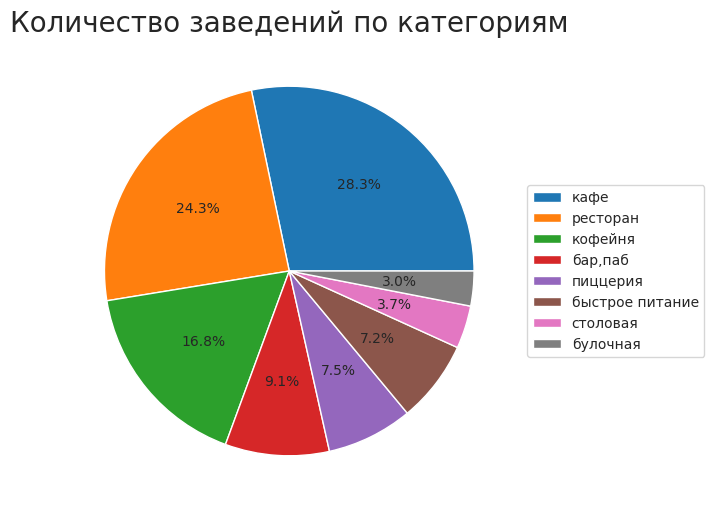

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(x=df['category'].value_counts(), autopct='%1.1f%%')
plt.title('Количество заведений по категориям', fontsize=20)
plt.legend(df['category'].value_counts().index.tolist(), loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

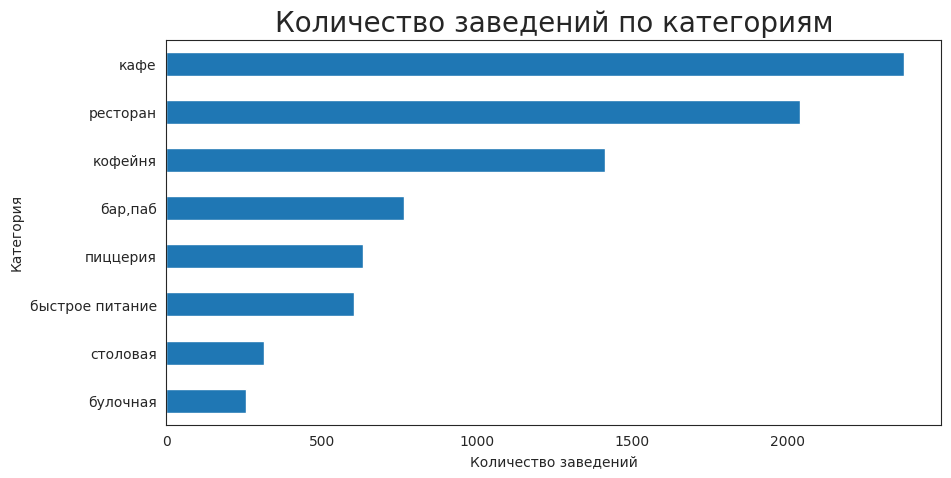

In [ ]:
plt.figure(figsize=(10, 5)) 
df['category'].value_counts().sort_values().plot(kind='barh')
plt.ylabel("Категория")
plt.xlabel("Количество заведений")
plt.title("Количество заведений по категориям", fontsize=20)
plt.show()

Заведения общественного питания представлены в 8 категориях, лидирующую позицию занимают кафе (28%), за ними рестораны(24%) и кофейни(16%). Булочные и столовые в меньшинстве

### Распределение количества посадочных мест

При первичном анализе данных увидели, что максимальное количество мест 1288, это очень много, ведь 75% заведений имеют до 140 посадочных мест, сразу ограничим график

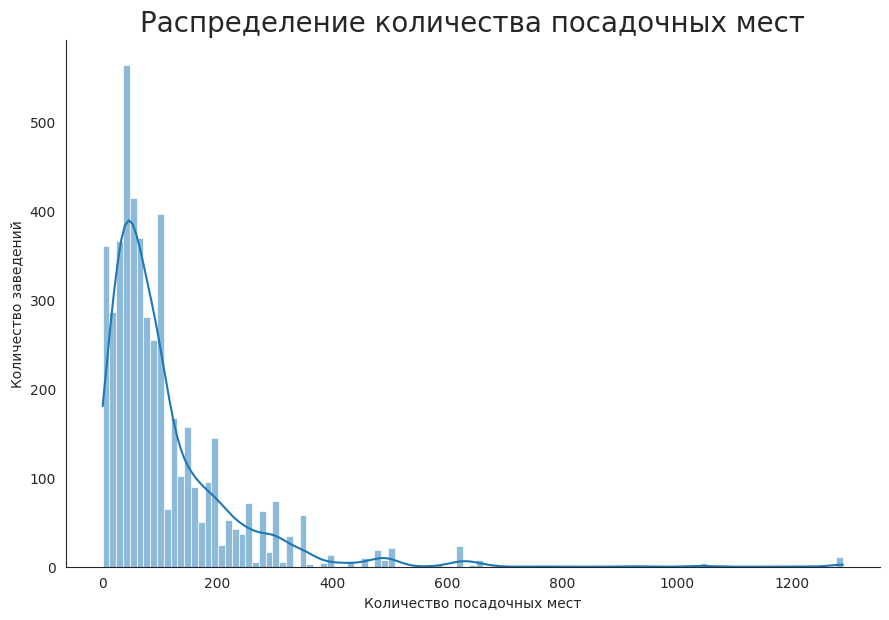

In [ ]:
sns.displot(df['seats'], kde=True, height=6, aspect=1.5)
#plt.xlim(0, 600)
plt.title("Распределение количества посадочных мест",fontsize=20)
plt.ylabel("Количество заведений")
plt.xlabel("Количество посадочных мест")
plt.show()

Отметим, что количество посадочных начинается с 0, это можно объяснить тем, что некоторые заведения готовят еду только на вынос и доставку, и посадочные места не предусмотрены. Наиболее часто встречаются заведения с количеством мест около 40-50

### Количество посадочных мест по категориям

In [ ]:
fig = go.Figure()
fig = px.box(df, y='category', x='seats')
fig.update_layout(title="Количество посадочных мест по категориям",
                  xaxis_title="Количество посадочных мест",
                  yaxis_title="Категория",
                  title_x=0.5)
fig.update_xaxes(range=[0, 350])
fig.show()

В медиане наибольшее количество посадочных мест в ресторанах и составляет 86, чуть меньше в барах/пабах. Меньше всего мест в булочных, медианное количество посадочных мест составляет 50.

### Количество сетевых и несетевых заведений

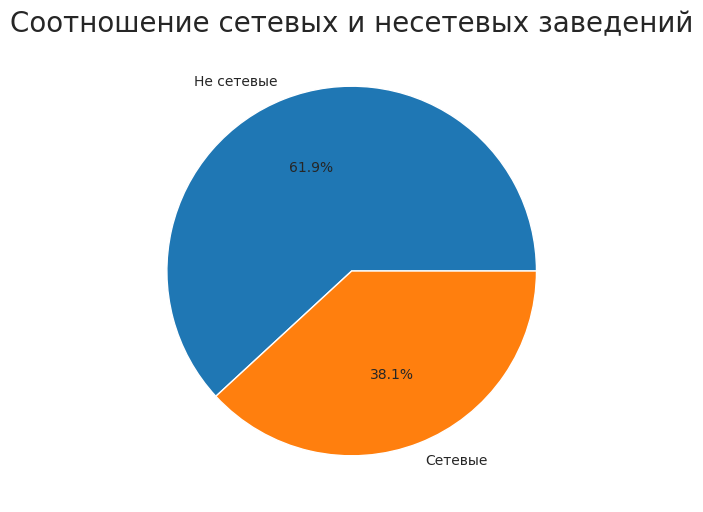

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(x=df['chain'].value_counts(), autopct='%1.1f%%', labels = ['Не сетевые', 'Сетевые'])
plt.title('Соотношение сетевых и несетевых заведений', fontsize=20)
plt.show()

В датасете преобладают несетевые заведения

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Супер, именно доля заведений корректно дает ответ на поставленный вопрос. 
</div>

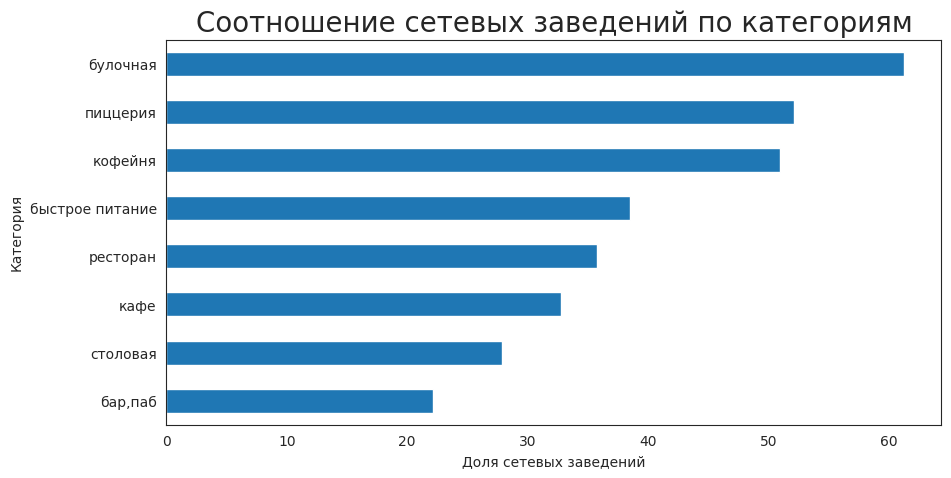

In [ ]:
# создаем таблицу, где каждой категории будет соответствовать кол-во сетевых, несетевых заведений и их сотношение
category_chain = df.pivot_table(index='category', columns='chain', values='address', aggfunc='count')
category_chain.columns = ['no', 'yes']
category_chain['ratio'] = round(category_chain['yes'] / (category_chain['no'] + category_chain['yes']) * 100, 1)

plt.figure(figsize=(10, 5)) 
category_chain['ratio'].sort_values().plot(kind='barh')
plt.ylabel("Категория")
plt.xlabel("Доля сетевых заведений")
plt.title("Соотношение сетевых заведений по категориям", fontsize=20)
plt.show()

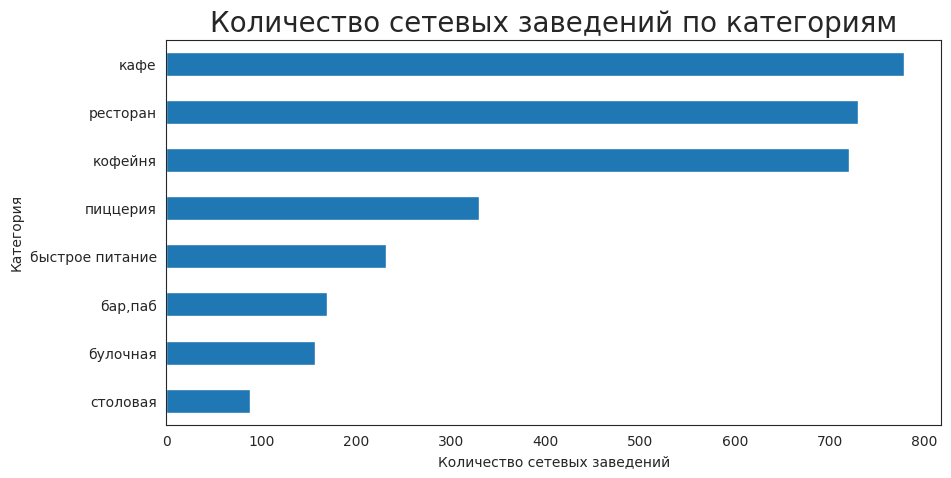

In [ ]:
plt.figure(figsize=(10, 5)) 
category_chain['yes'].sort_values().plot(kind='barh')
plt.ylabel("Категория")
plt.xlabel("Количество сетевых заведений")
plt.title("Количество сетевых заведений по категориям", fontsize=20)
plt.show()

В абсолютном значении по сетевым заведениям лидеры остаются прежние - кафе, рестораны и кофейни. А вот в относительном значении, наибольшую долю среди сетевых заведений имеют булочные, сетевые булочные составляют более 60% среди всех представленных булочных

### Популярные сети общественного питания

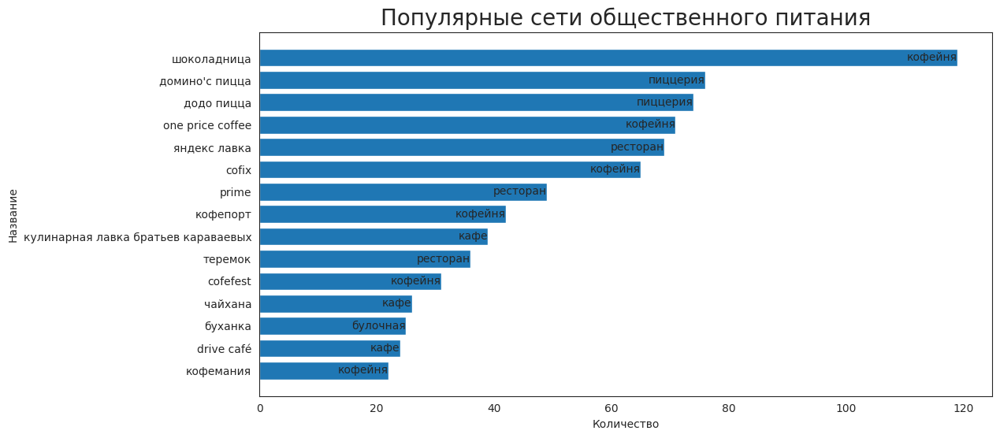

In [ ]:
# создаем таблицу, где 15 популярным сетевым заведениям будет соответствовать категория и их количество
popular = df.pivot_table(index=['name','category'], columns='chain', values='address', aggfunc='count')
popular.columns = ['no', 'cnt']
popular = popular.drop('no', axis=1).sort_values(by = 'cnt', ascending=False)[:15].reset_index()

plt.figure(figsize=(12, 6))
plt.barh(popular['name'], popular['cnt'])
plt.xlabel('Количество')
plt.ylabel('Название')
plt.title('Популярные сети общественного питания', fontsize=20)
# настраиваем отображение категорий
plt.gca().invert_yaxis()
for i, row in popular.iterrows():
    plt.text(row['cnt'], row['name'], row['category'], ha='right', va='center')

plt.show()

Самая популярная сеть в предоставленном датасете - Шоколадница. На 2 и 3 месте два конкурента - Домино'с и Додо пицца. Большим спросом пользуются кофейни. В целом, можно сказать, что все эти заведения объединяет быстрота обслуживания и средний ценовой сегмент

### Количество заведений по категориям и округам

<ipython-input-69-9f7b238e0049>:3: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



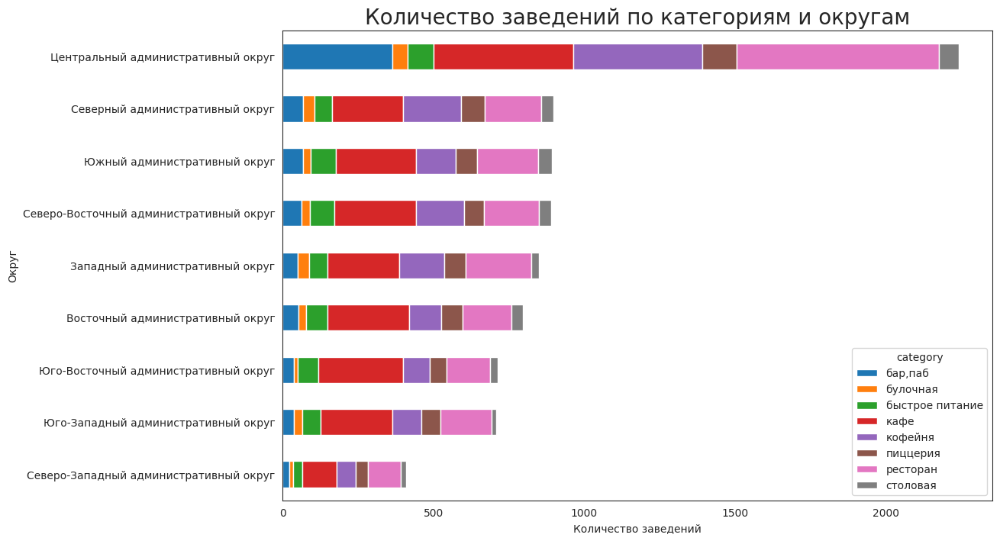

In [ ]:
# создаем таблицу, где в каждом округе будет посчитано кол-во заведений по категориям
district = df.pivot_table(index='district', columns='category', values='address', aggfunc='count', fill_value=0).reset_index()
district['total'] = district.sum(axis=1)
district = district.sort_values(by='total')
district.drop(columns='total', inplace=True)

fig, ax = plt.subplots(figsize=(12, 8))
district.plot(kind='barh', x='district', stacked=True, ax=ax)
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Округ')
ax.set_title('Количество заведений по категориям и округам', fontsize=20)
plt.show()

Во всех районах больше распространены кафе. Выделяется лишь центральный округ, здесь преобладают рестораны, а в сравнении с другими районами заметно больше кофеен и баров/пабов

### Средний рейтинг заведений по категориям

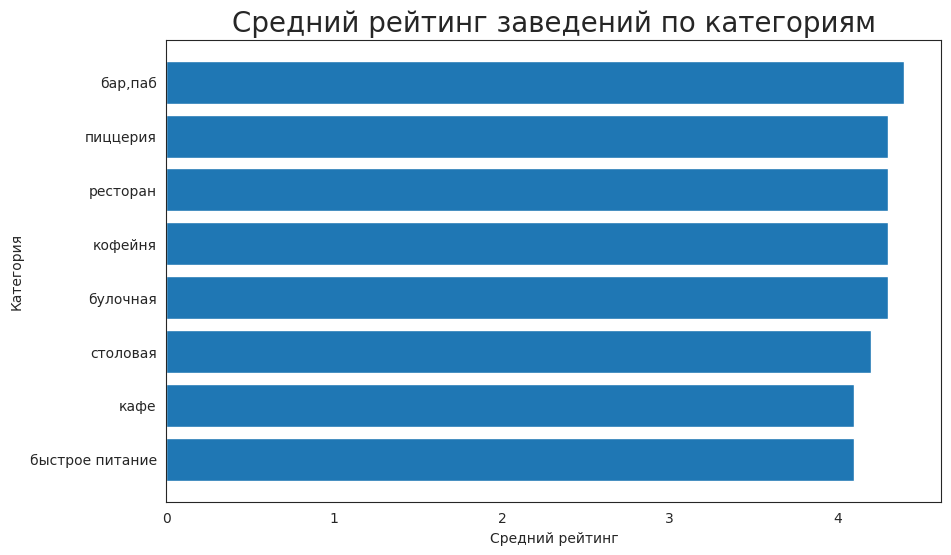

In [ ]:
# посчитаем средний рейтинг по категориям
rating = df.pivot_table(index='category', values='rating', aggfunc='mean').reset_index().sort_values(by='rating')
rating['rating'] = rating['rating'].round(1)
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(rating['category'], rating['rating'])
ax.set_title('Средний рейтинг заведений по категориям', fontsize=20)
ax.set_xlabel('Средний рейтинг')
ax.set_ylabel('Категория')

plt.show()

In [ ]:
fig = go.Figure()
fig = px.box(df, y='category', x='rating')
fig.update_layout(title="Средний рейтинг заведений по категориям",
                  xaxis_title="Средний рейтинг",
                  yaxis_title="Категория",
                  title_x=0.5)
fig.show()

Усредненные рейтинги различных категорий общественного питания практически не различаются. Выделяются лишь бары/пабы, у них средний рейтинг 4.4

### Фоновая картограмма со средним рейтингом заведений каждого округа

In [ ]:
# посчитаем средний рейтинг по округам
rating_district = df.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
rating_district['rating'] = rating_district['rating'].round(1)

In [ ]:
geo_json = gpd.read_file('geomap.geojson')
# загружаем JSON-файл с границами округов Москвы
state_geo = 'geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

m    

В центре Москвы рейтинг заведений выше остальных округов и составляет 4.4

### Заведения Москвы на карте

In [ ]:
maps = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(maps)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
maps

### Распределение заведений по категориям в топе-15 улиц

<ipython-input-75-e34f22119bf6>:8: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



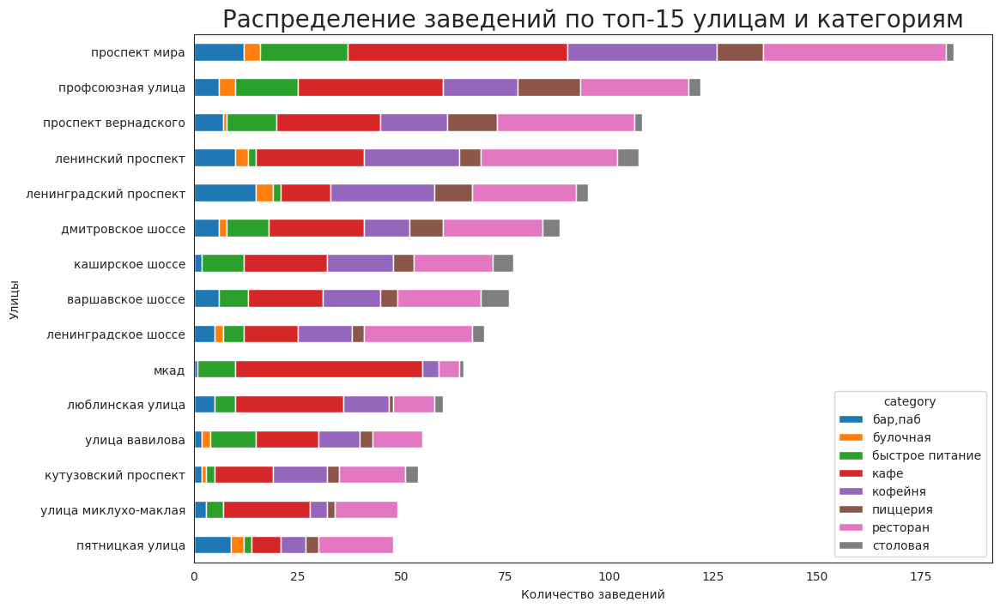

In [ ]:
# определяем топ-15 улиц
top_streets = df['street'].value_counts()[:15].index.to_list()
# фильтруем датасет
df_top_streets = df[df['street'].isin(top_streets)]
# таблица, где каждой улице из топ-15 будет соответствовать кол-во заведений каждой категории
top_street = df_top_streets.pivot_table(index='street', columns='category', values='address', aggfunc='count', fill_value=0)\
                            .reset_index()
top_street['total'] = top_street.sum(axis=1)
top_street = top_street.sort_values(by='total')
top_street.drop(columns='total', inplace=True)

fig, ax = plt.subplots(figsize=(12, 8))
top_street.plot(kind='barh', x='street', stacked=True, ax=ax)

ax.set_xlabel('Количество заведений')
ax.set_ylabel('Улицы')
ax.set_title('Распределение заведений по топ-15 улицам и категориям', fontsize=20)
plt.show()

Больше всего заведений на проспекте Мира, преобладают рестораны, кафе и кофейни

### Количество улиц с одним заведением

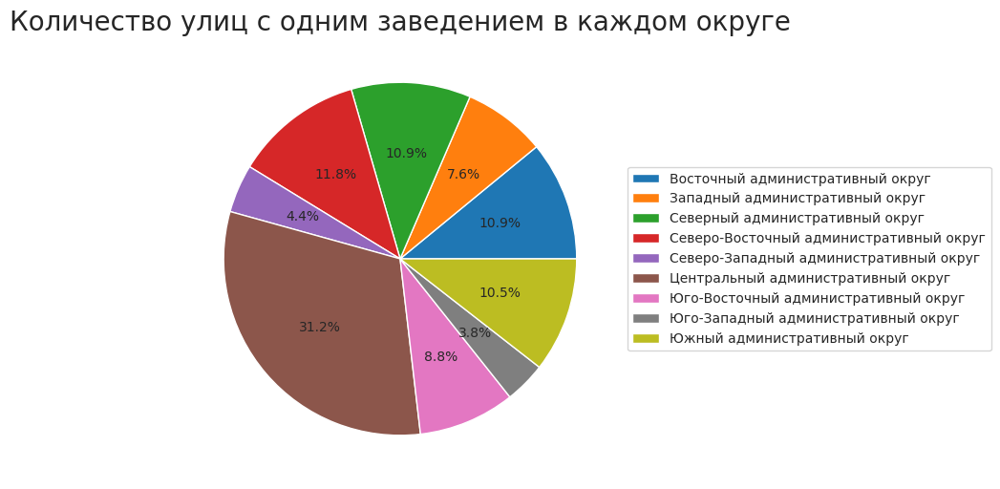

In [ ]:
# посчитаем повторения улиц в каждом округе
grouped = df.groupby(['district', 'street'], as_index=False).agg({'street':'count'})
# оставляем только улицы с одним заведением
single_street = grouped[grouped['street'] == 1]
# группируем данные по округу и считаем количество улиц с одним заведением
streets_per_district = single_street.groupby('district')['street'].count()

plt.figure(figsize=(6, 6))
plt.pie(x=streets_per_district, autopct='%1.1f%%')
plt.title('Количество улиц с одним заведением в каждом округе', fontsize=20)
plt.legend(streets_per_district.index.tolist(), loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

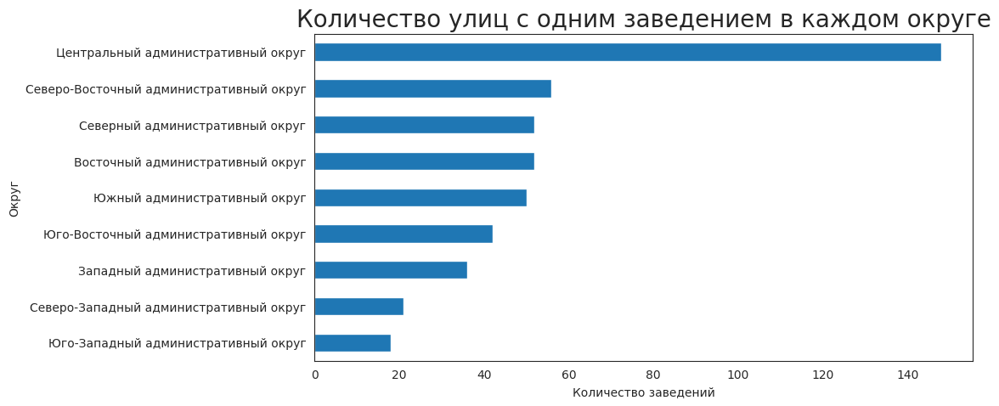

In [ ]:
plt.figure(figsize=(10, 5)) 
streets_per_district.sort_values().plot(kind='barh')
plt.ylabel("Округ")
plt.xlabel("Количество заведений")
plt.title("Количество улиц с одним заведением в каждом округе", fontsize=20)
plt.show()

In [ ]:
streets_per_district.sum()

475

Всего 476 улиц на которых расположено по единственному заведению, большинство таких улиц находятся в центральном округе. На это может влиять конкуренция и высокая стоимость аренды

### Фоновая картограмма с медианным средним чеком

In [ ]:
# посчитаем медианный средний чек
avg_bill = df.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()

mp = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам',
).add_to(mp)

mp   

Самый высокий средний чек в центре Москвы, при удалении от центра средний чек снижается. Стоит отметить, что средний чек в ЗАО в медианном значении - наравне с центром Москвы. ЗАО считается достаточно престижным районом, и даже цены на жилье здесь на втором месте после центра Москвы. То есть, в ЗАО живут довольно обеспеченные люди, поэтому и средний чек выше.

### Зависимость среднего чека от рейтинга заведения

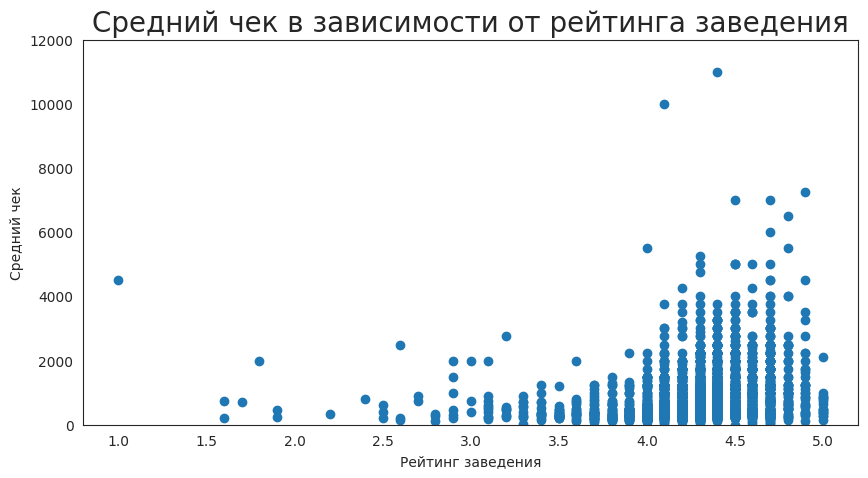

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(df['rating'], df['middle_avg_bill']) 
plt.ylim(0, 12000)
plt.title('Средний чек в зависимости от рейтинга заведения', fontsize=20)
plt.xlabel('Рейтинг заведения')
plt.ylabel('Средний чек'); 

Заметно, что с увеличением рейтинга возрастает средний чек, но зависимость слабая

### Количество посадочных мест в топе-15 улиц

In [ ]:
fig = go.Figure()
fig = px.box(df_top_streets, y='category', x='seats')
fig.update_layout(title="Количество посадочных мест по категориям в топе-15 улиц",
                  xaxis_title="Количество посадочных мест",
                  yaxis_title="Категория",
                  title_x=0.5)
fig.update_xaxes(range=[0, 600])
fig.show()

На улицах, где расположено большего всего заведений посадочных мест больше, здесь лидирует быстрое питание со 150 посадочными местами в медиане, меньше всего мест на таких улицах в кафе

### Категории заведений с низким рейтингом

<ipython-input-82-e3ef4aa0e8d0>:7: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



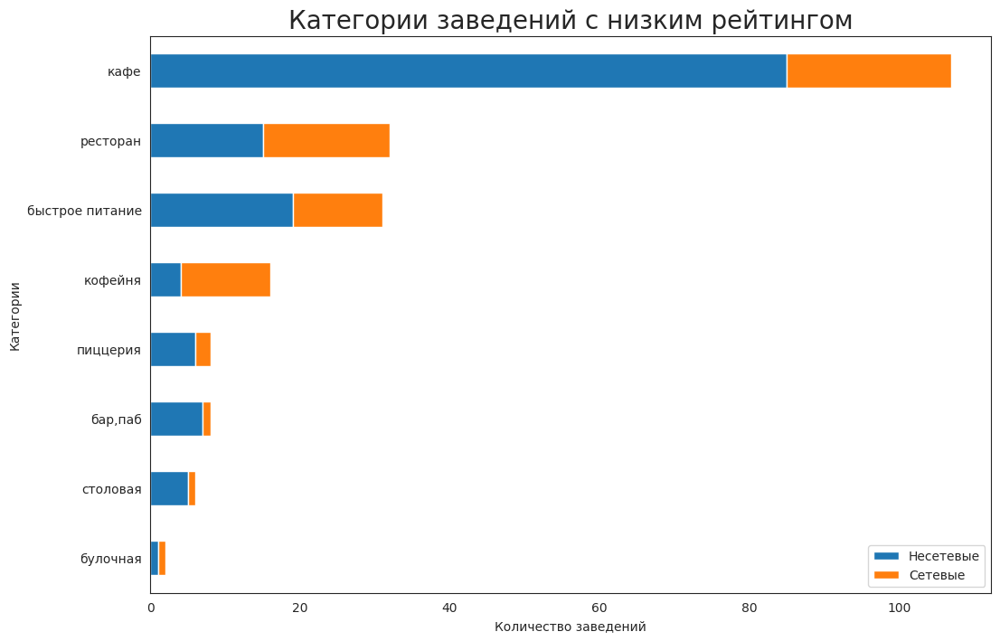

In [ ]:
# фильтруем заведения с рейтингом ниже 3
df_out = df[df['rating'] < 3]
# таблица где каждой категории соответствует количество сетевых и несетевых заведений
out = df_out.pivot_table(index='category', columns='chain', values='address', aggfunc='count', fill_value=0).reset_index()
out.columns = ['category', 'Несетевые', 'Сетевые']

out['total'] = out.sum(axis=1)
out = out.sort_values(by='total')
out.drop(columns='total', inplace=True)

fig, ax = plt.subplots(figsize=(12, 8))
out.plot(kind='barh', x='category', stacked=True, ax=ax)

ax.set_xlabel('Количество заведений')
ax.set_ylabel('Категории')
ax.set_title('Категории заведений с низким рейтингом', fontsize=20)
plt.show()

Большего всего заведений с рейтингом ниже 3 в категории - несетевые кафе

### Режим работы заведений

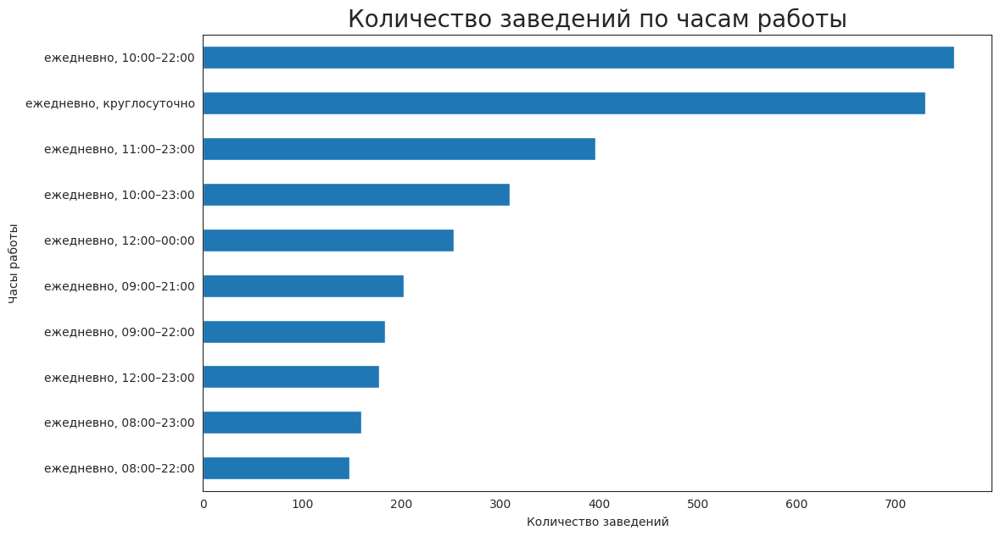

In [ ]:
plt.figure(figsize=(12, 7)) 
df['hours'].value_counts()[:10].sort_values().plot(kind='barh')
plt.ylabel("Часы работы")
plt.xlabel("Количество заведений")
plt.title("Количество заведений по часам работы",fontsize=20)
plt.show()

Большинство заведений работают ежедневно, с 10:00 до 22:00, на втором месте - круглосуточный режим работы

* В датасете представлено 8 категорий заведений общественного питания, наиболее распространены кафе (28%), рестораны (24%) и кофейни (16%)
* Больше всего посадочных мест в ресторанах (86 в медиане) и барах
* Преобладают несетевые заведения (62%)
* Среди сетевых заведений в абсолютном значении также популярны кафе, рестораны и кофейни. В относительном - булочные (61%)
* Наиболее распространенная сеть – шоколадница
* В топе сетей находятся заведения среднего ценового сегмента и предполагающие быстрое обслуживание.
* Кафе – наиболее популярный тип общепита во всех округах
* В центре Москвы рейтинг заведений выше остальных округов (4.4)
* Усредненные рейтинги различных категорий общественного питания практически не различаются. Выделяются лишь бары/пабы, у них средний рейтинг 4.4
* Больше всего заведений на проспекте Мира, преобладают рестораны, кафе и кофейни
* Большинство улиц, на которых расположено по единственному заведению находятся в центральном округе
* Самый высокий средний чек в центре Москвы и в ЗАО (1000 р)
* С увеличением рейтинга заведения средний чек немного увеличивается
* На улицах, где расположено большего всего заведений посадочных мест больше, здесь лидирует быстрое питание со 150 посадочными местами в медиане, меньше всего мест на таких улицах в кафе
* Большего всего заведений с рейтингом ниже 3 в категории - несетевые кафе
* У многих заведений режим работы: ежедневно, с 10:00 до 22:00, на втором месте - круглосуточный режим работы


## Рекомендации для инвесторов

Инвесторы остановили свой выбор на открытии кофейни. Исследуем еще несколько факторов

In [ ]:
data = df[df['category'] == 'кофейня']
data.shape[0]

1413

В датасете представлено 1413 кофеен

### Часы работы кофеен

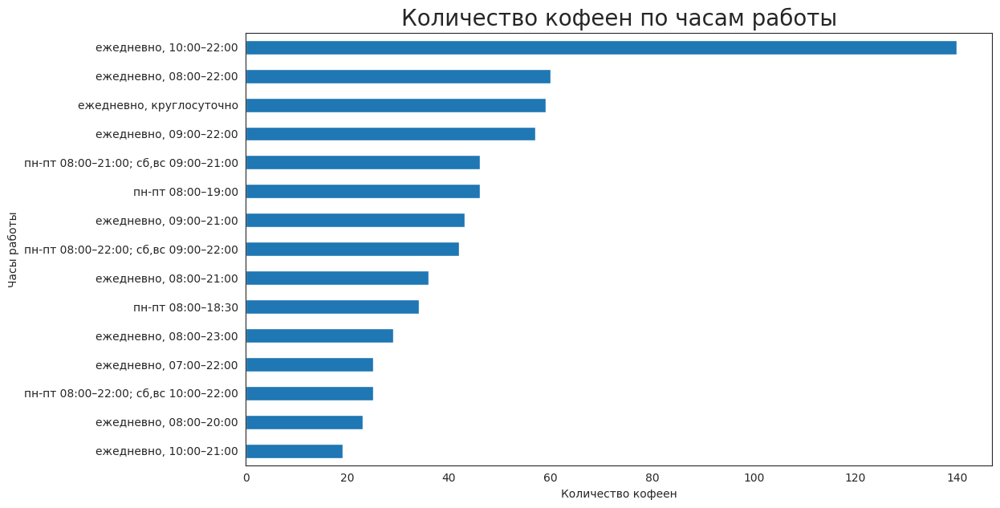

In [ ]:
plt.figure(figsize=(12, 7)) 
data['hours'].value_counts()[:15].sort_values().plot(kind='barh')
plt.ylabel("Часы работы")
plt.xlabel("Количество кофеен")
plt.title("Количество кофеен по часам работы", fontsize=20)
plt.show()

In [ ]:
data['is_24/7'].value_counts()

False    1339
True       59
Name: is_24/7, dtype: int64

Наиболее часто встречаемый режим работы кофеен: ежедневно, с 10:00 до 22:00. Также встречаются кофейни с круглосуточным режимом работы, таких кофеен 59

### Фоновая картограмма со средним рейтингом кофеен каждого округа

In [ ]:
# посчитаем средний рейтинг кофеен по округам
rating_cofe = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
rating_cofe['rating'] = rating_district['rating'].round(1)
rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(rating)

rating    

Рейтинг кофеен выше в центре Москвы, в остальных округах рейтинг примерно одинаковый.

### Фоновая картограмма с медианной стоимостью чашки капучино

In [ ]:
# посчитаем медианную стоимость чашки капучино
avg_cofe = df.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index()
cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_cofe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино',
).add_to(cup)

cup   

При выборе места для кофейни, можно рассматривать среднюю стоимость чашки капучино:
* для ЦАО, ЗАО, ЮЗАО - 187-197;
* для САО, СВАО - 156-166;
* для ЮАО, СЗАО - 146-156;
* для ВАО, ЮВАО - 135-145. 

### Соотношение сетевых и несетевых кофеен

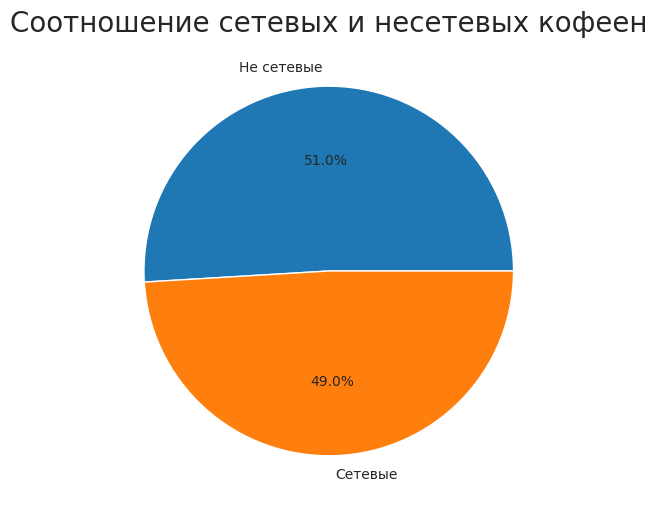

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(x=data['chain'].value_counts(), autopct='%1.1f%%', labels = ['Не сетевые', 'Сетевые'])
plt.title('Соотношение сетевых и несетевых кофеен', fontsize=20)
plt.show()

Количество сетевых и несетевых кофеен примерно одинаковое

### Средняя стоимость чашки капучино в топе-15 улиц

In [ ]:
# фильтруем топ-15 улиц
coffee_top_streets = data[data['street'].isin(top_streets)]

fig = go.Figure()
fig = px.box(coffee_top_streets, y='street', x='middle_coffee_cup')
fig.update_layout(title="Средняя стоимость чашки капучино в топе-15 улиц",
                  xaxis_title="Средняя стоимость чашки капучино",
                  yaxis_title="Улица",
                  title_x=0.5)
fig.update_xaxes(range=[0, 300])
fig.show()

Если посмотреть в разрезе топ-улиц, то цены здесь варьируются чуть больше. Повышение цен обуславливается приближением к центру, стоимость аренды здесь выше

### Завивисимость среднего чека от рейтинга кофейни

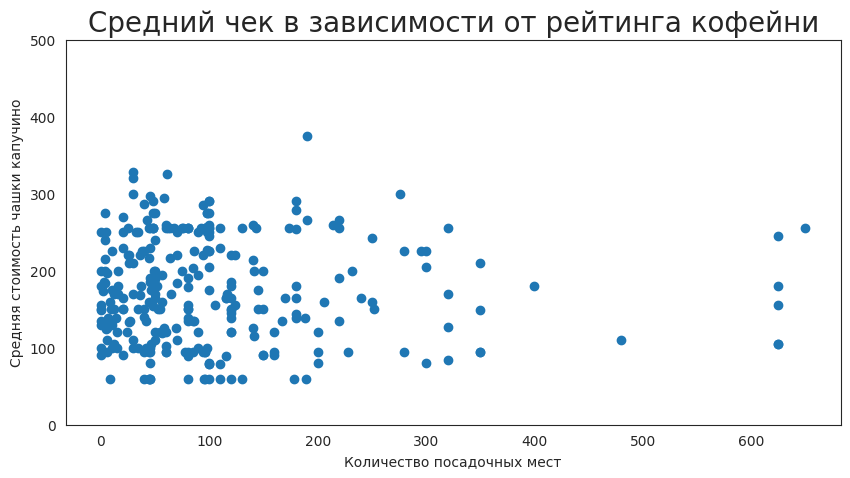

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(data['seats'], data['middle_coffee_cup']) 
plt.ylim(0, 500)
plt.title('Средний чек в зависимости от рейтинга кофейни', fontsize=20)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Средняя стоимость чашки капучино'); 

Количество посадочных мест в кофейне никак не влияет на стоимость кофе

### Количество кофеен по округам

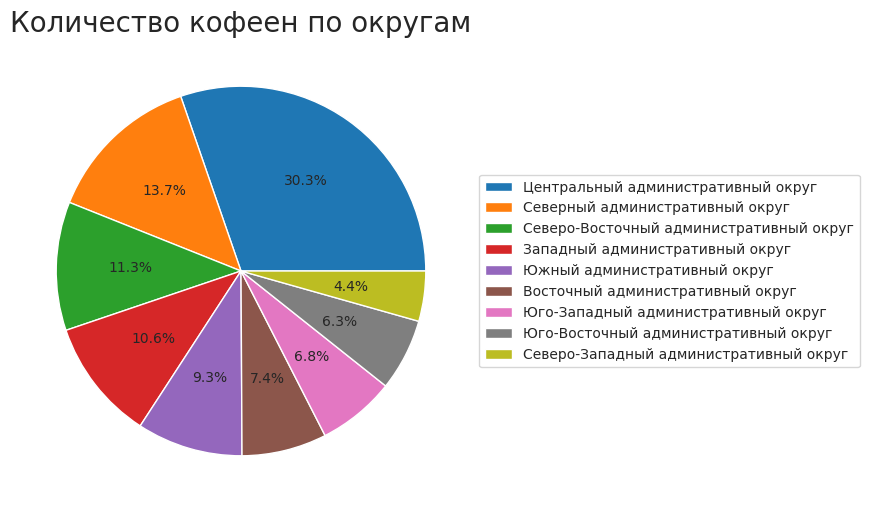

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(x=data['district'].value_counts().values, autopct='%1.1f%%')
plt.title('Количество кофеен по округам', fontsize=20)
plt.legend(data['district'].value_counts().index, loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

Больше всего кофеен расположено в центре Москвы - 30%

При анализе кофеен получили следующие результаты:
* В датасете представлено 1413 кофеен, почти половина из них - сетевые. 
* Большинство кофеен расположено в центре Москвы - 30% от всех кофеен.
* Режим работы большинства кофеен: ежедневно, с 10:00 до 22:00, но встречаются кофейни с круглосуточным режимом работы.
* Самый высокий рейтинг у кофеен в центральном округе. 
* Помимо центрального, такие же высокие цены в ЗАО, ЮЗАО, медианная стоимость чашки капучино там варьируется от 187 до 197. 
* Цена кофе не зависит от количества посадочных мест в кофейне. 
* С приближением к центру Москвы возрастает арендная плата за помещение, а вместе с ней и стоимость кофе.

С учетом имеющихся данных и желанием инвесторов открыть кофейню формата кофейни из сериала "Друзья", можно рекомендовать следующее:
* При выборе места расположения кофейни, стоит рассматривать центр Москвы. Несмотря на то, что в центре расположены большинство кофеен, в центре много туристов и местных жителей, которые могут захотеть посетить новую необычную кофейню, а также найдется немало фанатов этого сериала.
* Оптимальный режим работы кофейни - ежедневно, с 10:22, так как этот режим является наиболее популярным среди кофеен, таким образом, по режиму работы новая кофейня не будет уступать конкурентам. 
* При установлении стоимости кофе, необходимо ориентироваться не только на медианную стоимость чашки капучино в центральном округе, которая составляет 187-197 рублей, но и учитывать улицу расположения, опираясь на стоимость аренды.
* При выборе количества посадочных мест лучше придерживаться концепции такой же уютной кофейни и планировать до 40 мест
* Стоит учитывать, что интерьер и атмосфера являются ключевыми элементами кофейни, особенно в случае создания чего-то необычного и запоминающегося.  Стоит обратить внимание на элементы интерьера, связанные с сериалом "Друзья", чтобы создать атмосферу, которая будет восприниматься посетителями как нечто привычное и домашнее.

## Презентация результатов

Презентация: <https://drive.google.com/file/d/1W_GkQFu68MRcqmmLf7aYjKWEDZ3EoW1W/view?usp=sharing> 

## Выводы

В ходе работы изучили датасет с заведениями общественного питания в Москве. Обнаружены пропуски в часах работы, количестве посадочных мест, категории цен и средней стоимости заказа, которые могут быть обусловлены ошибкой при выгрузке данных, либо означать, что данные по этим параметрам не были добавлены на момент выгрузки. Пропуски оставили, так как заполнение их может привести к искажению данных. Стоит также учитывать, что информация о заведениях могла быть добавлена пользователями ошибочно, а также рейтинг заведения мог быть сформирован из малого количества оценок. В ходе исследования было выявлено, что:
* В датасете представлено 8406 заведений в 8 категориях заведений общественного питания, наиболее распространены кафе (28%), рестораны (24%) и кофейни (16%)
* Больше всего посадочных мест в ресторанах (86 в медиане) и барах
* Преобладают несетевые заведения (62%)
* Среди сетевых заведений в абсолютном значении также популярны кафе, рестораны и кофейни. В относительном - булочные (61%)
* Наиболее распространенная сеть – шоколадница
* В топе сетей находятся заведения среднего ценового сегмента и предполагающие быстрое обслуживание.
* Кафе – наиболее популярный тип общепита во всех округах
* В центре Москвы рейтинг заведений выше остальных округов (4.4)
* Усредненные рейтинги различных категорий общественного питания практически не различаются. Выделяются лишь бары/пабы, у них средний рейтинг 4.4
* Больше всего заведений на проспекте Мира, преобладают рестораны, кафе и кофейни
* Большинство улиц, на которых расположено по единственному заведению находятся в центральном округе
* Самый высокий средний чек в центре Москвы и в ЗАО (1000 р)
* С увеличением рейтинга заведения средний чек немного увеличивается
* На улицах, где расположено большего всего заведений посадочных мест больше, здесь лидирует быстрое питание со 150 посадочными местами в медиане, меньше всего мест на таких улицах в кафе
* Большего всего заведений с рейтингом ниже 3 в категории - несетевые кафе
* У многих заведений режим работы: ежедневно, с 10:00 до 22:00, на втором месте - круглосуточный режим работы

При анализе кофеен выявили, что:
* В датасете представлено 1413 кофеен, почти половина из них - сетевые. 
* Большинство кофеен расположено в центре Москвы - 30% от всех кофеен.
* Режим работы большинства кофеен: ежедневно, с 10:00 до 22:00, но встречаются кофейни с круглосуточным режимом работы.
* Самый высокий рейтинг у кофеен в центральном округе. 
* Помимо центрального, такие же высокие цены в ЗАО, ЮЗАО, медианная стоимость чашки капучино там варьируется от 187 до 197. 
* Цена кофе не зависит от количества посадочных мест в кофейне. 
* С приближением к центру Москвы возрастает арендная плата за помещение, а вместе с ней и стоимость кофе.

С учетом имеющихся данных и желанием инвесторов открыть кофейню формата кофейни из сериала "Друзья", можно рекомендовать следующее:
* При выборе места расположения кофейни, стоит рассматривать центр Москвы. Несмотря на то, что в центре расположены большинство кофеен, в центре много туристов и местных жителей, которые могут захотеть посетить новую необычную кофейню, а также найдется немало фанатов этого сериала.
* Оптимальный режим работы кофейни - ежедневно, с 10:22, так как этот режим является наиболее популярным среди кофеен, таким образом, по режиму работы новая кофейня не будет уступать конкурентам. 
* При установлении стоимости кофе, необходимо ориентироваться не только на медианную стоимость чашки капучино в центральном округе, которая составляет 187-197 рублей, но и учитывать улицу расположения, опираясь на стоимость аренды.
* При выборе количества посадочных мест лучше придерживаться концепции такой же уютной кофейни и планировать до 40 мест
* Стоит учитывать, что интерьер и атмосфера являются ключевыми элементами кофейни, особенно в случае создания чего-то необычного и запоминающегося.  Стоит обратить внимание на элементы интерьера, связанные с сериалом "Друзья", чтобы создать атмосферу, которая будет восприниматься посетителями как нечто привычное и домашнее.